In [124]:
%pylab inline
import pandas as pd
import numpy as np
import os
import geopandas as gpd
from geopandas import GeoDataFrame, read_file
from geopandas.tools import sjoin
from shapely.geometry import Point, mapping,shape
import time
import matplotlib.pyplot as plt
from fiona import collection
import json

Populating the interactive namespace from numpy and matplotlib


`%matplotlib` prevents importing * from pylab and numpy


## Reading in data

In [125]:
threeOneOnePath = '../311_Service_Requests_from_2010_to_Present.csv'
vzPath = '../weather_raw_NYC/NYPD_Motor_Vehicle_Collisions.csv'

In [126]:
vz = pd.read_csv(vzPath)

In [127]:
vz.head()

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN
1,12/31/15,8:19,NaN,NaN,NaN,NaN,NaN,HOYT AVENUE SOUTH,27 STREET,NaN,0,0,0,0,0,0,0,0,Failure to Yield Right-of-Way,Unspecified,NaN,NaN,NaN,3364442,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
2,12/31/15,8:20,NaN,NaN,40.525888,-74.229805,"(40.5258882, -74.2298047)",NaN,NaN,NaN,0,0,0,0,0,0,0,0,Traffic Control Disregarded,NaN,NaN,NaN,NaN,3363349,PASSENGER VEHICLE,NaN,NaN,NaN,NaN
3,12/31/15,8:30,BROOKLYN,11236,40.641947,-73.916619,"(40.641947, -73.9166193)",EAST 83 STREET,FOSTER AVENUE,NaN,0,0,0,0,0,0,0,0,View Obstructed/Limited,View Obstructed/Limited,NaN,NaN,NaN,3363070,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
4,12/31/15,8:30,MANHATTAN,10038,40.709872,-74.007052,"(40.7098718, -74.0070517)",FULTON STREET,DUTCH STREET,NaN,0,0,0,0,0,0,0,0,Other Vehicular,Other Vehicular,NaN,NaN,NaN,3362791,PASSENGER VEHICLE,UNKNOWN,NaN,NaN,NaN


In [128]:
d311 = pd.read_csv(threeOneOnePath)

In [129]:
pd.options.display.max_columns = 999

In [130]:
d311.head()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,Street Name,Cross Street 1,Cross Street 2,Intersection Street 1,Intersection Street 2,Address Type,City,Landmark,Facility Type,Status,Due Date,Resolution Description,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,School Name,School Number,School Region,School Code,School Phone Number,School Address,School City,School State,School Zip,School Not Found,School or Citywide Complaint,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location
0,29615986,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,APARTMENT ONLY,RESIDENTIAL BUILDING,10467,3343 DECATUR AVENUE,DECATUR AVENUE,EAST 209 STREET,EAST GUN HILL ROAD,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,07 BRONX,BRONX,1019384,259016,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.877543,-73.872953,"(40.877543445188735, -73.87295252485556)"
1,29617985,01/01/2015 12:00:00 AM,01/05/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,PAINT/PLASTER,CEILING,RESIDENTIAL BUILDING,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,NaN,NaN,ADDRESS,NEW YORK,NaN,NaN,Closed,NaN,The Department of Housing Preservation and Dev...,01/05/2015 12:00:00 AM,07 MANHATTAN,MANHATTAN,989622,221864,Unspecified,MANHATTAN,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.775640,-73.980604,"(40.775640103121845, -73.98060413328993)"
2,29618358,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,APARTMENT ONLY,RESIDENTIAL BUILDING,10455,520 TINTON AVENUE,TINTON AVENUE,EAST 147 STREET,EAST 149 STREET,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,01 BRONX,BRONX,1010120,235138,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.812037,-73.906544,"(40.81203739816162, -73.90654401152729)"
3,29614426,01/01/2015 12:00:00 AM,01/04/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,ENTIRE BUILDING,RESIDENTIAL BUILDING,10028,1457 3 AVENUE,3 AVENUE,EAST 82 STREET,EAST 83 STREET,NaN,NaN,ADDRESS,NEW YORK,NaN,NaN,Closed,NaN,The Department of Housing Preservation and Dev...,01/04/2015 12:00:00 AM,08 MANHATTAN,MANHATTAN,996517,222158,Unspecified,MANHATTAN,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.776440,-73.955709,"(40.776440176160676, -73.95570886749827)"
4,29614347,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,ENTIRE BUILDING,RESIDENTIAL BUILDING,10463,223 NAPLES TERRACE,NAPLES TERRACE,BROADWAY,GODWIN TERRACE,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,08 BRONX,BRONX,1010496,259816,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.879770,-73.905089,"(40.87977010194551, -73.9050891105516)"


In [131]:
pd.reset_option('display.max_columns')

## Restricting 311 columns, and to only DOT

In [132]:
cols = list(d311.columns.values)
colsKeep = cols[3:6]+cols[-3:]
print(colsKeep)

['Agency', 'Agency Name', 'Complaint Type', 'Latitude', 'Longitude', 'Location']


In [133]:
# checking for percent of 311 DOT complaints that include lat/lon
float(len(d311[colsKeep][d311['Agency'] == 'DOT'][pd.notnull(d311['Location'])])) / len(d311[colsKeep][d311['Agency'] == 'DOT'])

0.7665181265972338

In [134]:
d311[['Agency', 'Complaint Type', 'Descriptor', 'Location Type']][d311.Agency == 'DOT']

,Agency,Complaint Type,Descriptor,Location Type
1671,DOT,Street Light Condition,Street Light Out,NaN
1686,DOT,Traffic Signal Condition,Controller,NaN
1689,DOT,Street Light Condition,Street Light Out,NaN
1712,DOT,Traffic Signal Condition,Controller,NaN
1726,DOT,Traffic Signal Condition,Controller,NaN
1728,DOT,Street Condition,Pothole,NaN
1729,DOT,Traffic Signal Condition,Controller,NaN
1746,DOT,Traffic Signal Condition,Controller,NaN
1747,DOT,Street Condition,Pothole,NaN
1751,DOT,Traffic Signal Condition,Veh Signal Head,NaN


In [135]:
dot = d311[colsKeep][d311['Agency'] == 'DOT']

## Get rid of nulls for merge

In [136]:
vzSub = vz[pd.notnull(vz['LOCATION'])]
dotSub = dot[pd.notnull(dot['Location'])]

## Let's get counts of DOT complaint types

In [137]:
print(dotSub.groupby(['Complaint Type']).size().order(ascending=False))

Complaint Type
Street Condition              106233
Street Light Condition         53513
Broken Muni Meter              29011
Traffic Signal Condition       25315
Highway Condition               6255
Street Sign - Damaged           5731
Sidewalk Condition              4622
Street Sign - Missing           4283
Street Sign - Dangling          1617
Curb Condition                  1094
Bridge Condition                 501
Bus Stop Shelter Placement       215
Broken Parking Meter             125
Bike Rack Condition               98
Municipal Parking Facility        87
Public Toilet                     25
Highway Sign - Damaged            17
Highway Sign - Missing             5
Highway Sign - Dangling            3
Building Condition                 2
dtype: int64


/Users/afair/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:1: FutureWarning: order is deprecated, use sort_values(...)
  if __name__ == '__main__':


## Restrict to selected complaint types

In [138]:
complaints = ['Street Condition', 'Traffic Signal Condition']
dotSub = dotSub[dotSub['Complaint Type'].isin(complaints)]

## Make VZ indexes a column so they don't get lost?

In [139]:
# vzSub['vzIndex'] = vzSub.index

## Create point geometries from lat/lon for both VZ & 311 data

In [140]:
vzSub['geometry'] = vzSub.apply(lambda z: Point(z.LONGITUDE, z.LATITUDE), axis=1)
dotSub['geometry'] = dotSub.apply(lambda z: Point(z.Longitude, z.Latitude), axis=1)

/Users/afair/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [141]:
vzSub.head()

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,geometry
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,...,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,POINT (-73.99717270000001 40.6122155)
2,12/31/15,8:20,NaN,NaN,40.525888,-74.229805,"(40.5258882, -74.2298047)",NaN,NaN,NaN,...,NaN,NaN,NaN,3363349,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,POINT (-74.2298047 40.5258882)
3,12/31/15,8:30,BROOKLYN,11236,40.641947,-73.916619,"(40.641947, -73.9166193)",EAST 83 STREET,FOSTER AVENUE,NaN,...,NaN,NaN,NaN,3363070,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN,POINT (-73.91661929999999 40.64194699999999)
4,12/31/15,8:30,MANHATTAN,10038,40.709872,-74.007052,"(40.7098718, -74.0070517)",FULTON STREET,DUTCH STREET,NaN,...,NaN,NaN,NaN,3362791,PASSENGER VEHICLE,UNKNOWN,NaN,NaN,NaN,POINT (-74.00705170000001 40.7098718)
5,12/31/15,8:30,QUEENS,11691,40.596001,-73.770663,"(40.596001, -73.7706626)",BEACH 38 STREET,BEACH CHANNEL DRIVE,NaN,...,NaN,NaN,NaN,3363159,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN,POINT (-73.77066259999999 40.596001)


## Set buffer to go around VZ incidents - here I make it approx 0.1 mile

In [142]:
buf = 1. / 69 / 10 # ~69 miles per decimal degree, so this gives ~0.1 mile
print '{} decimal degrees'.format(buf)

0.00144927536232 decimal degrees


## Create geopandas geodataframes

In [143]:
dotGdf = gpd.GeoDataFrame(dotSub)
vzGdf = gpd.GeoDataFrame(vzSub)

## Write all VZ incidents that have lat/lon, for nearest neighbor join to LION intersections in QGIS

In [144]:
# with open('vzAllOut.geojson', 'w') as f:
#     f.write(vzGdf.to_json())

## Read back joined data from QGIS (geojson file)

In [145]:
joinFname = "nnJoinVzIx.geojson"
joined = gpd.read_file(joinFname)

In [146]:
print(type(joined))

joined.head()
# joined.shape

<class 'geopandas.geodataframe.GeoDataFrame'>


,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,...,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,geometry,join_NODEID,join_VIntersect
0,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,"(40.6122155, -73.9971727)",...,PASSENGER VEHICLE,None,None,None,None,11214,0.000002,POINT (-73.99717269999999 40.6122155),13476,
1,None,Traffic Control Disregarded,None,None,None,None,None,12/31/15,40.525888,"(40.5258882, -74.2298047)",...,PASSENGER VEHICLE,None,None,None,None,NaN,0.000119,POINT (-74.2298047 40.5258882),107269,
2,BROOKLYN,View Obstructed/Limited,View Obstructed/Limited,None,None,None,FOSTER AVENUE,12/31/15,40.641947,"(40.641947, -73.9166193)",...,PASSENGER VEHICLE,PASSENGER VEHICLE,None,None,None,11236,0.000002,POINT (-73.91661929999999 40.641947),26476,
3,MANHATTAN,Other Vehicular,Other Vehicular,None,None,None,DUTCH STREET,12/31/15,40.709872,"(40.7098718, -74.0070517)",...,PASSENGER VEHICLE,UNKNOWN,None,None,None,10038,0.000002,POINT (-74.00705170000001 40.7098718),15342,
4,QUEENS,Backing Unsafely,Unspecified,None,None,None,BEACH CHANNEL DRIVE,12/31/15,40.596001,"(40.596001, -73.7706626)",...,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,None,None,None,11691,0.000001,POINT (-73.77066259999999 40.596001),35650,


In [147]:
ixName = "intersectionNodes2.geojson"
ixs = gpd.read_file(ixName)

In [148]:
print(type(ixs))

ixs.head()
ixs.shape

<class 'geopandas.geodataframe.GeoDataFrame'>


(126240, 3)

In [149]:
missedIx = ixs[~ixs['NODEID'].isin(joined['join_NODEID'])]

In [150]:
missedIx.shape

(94456, 3)

In [151]:
missedIx.head()

,NODEID,VIntersect,geometry
0,1,,POINT (-74.25702151185868 40.49414563819848)
1,2,,POINT (-74.24443849259721 40.4922776914055)
2,3,,POINT (-74.25874354305617 40.49704148607953)
3,4,,POINT (-74.25874745972355 40.50270602375195)
4,5,,POINT (-74.25850081677106 40.50810821233416)


In [152]:
joined2=joined.rename(columns = {'join_NODEID':'NODEID', 'join_VIntersect': 'VIntersect'})

In [153]:
conc = pd.concat([joined2,missedIx], axis=0, ignore_index=True)

In [154]:
# conc[conc['VIntersect']!='']

## Reordering columns for convenient - put intersection node IDs in the front

In [155]:
cols = conc.columns.tolist()
ixCols = missedIx.columns.tolist()
ixCols = ixCols[:2]
finalCols = ixCols + [i for i in cols if i not in ixCols]
finalCols

[u'NODEID',
 u'VIntersect',
 u'BOROUGH',
 u'CONTRIBUTING FACTOR VEHICLE 1',
 u'CONTRIBUTING FACTOR VEHICLE 2',
 u'CONTRIBUTING FACTOR VEHICLE 3',
 u'CONTRIBUTING FACTOR VEHICLE 4',
 u'CONTRIBUTING FACTOR VEHICLE 5',
 u'CROSS STREET NAME',
 u'DATE',
 u'LATITUDE',
 u'LOCATION',
 u'LONGITUDE',
 u'NUMBER OF CYCLIST INJURED',
 u'NUMBER OF CYCLIST KILLED',
 u'NUMBER OF MOTORIST INJURED',
 u'NUMBER OF MOTORIST KILLED',
 u'NUMBER OF PEDESTRIANS INJURED',
 u'NUMBER OF PEDESTRIANS KILLED',
 u'NUMBER OF PERSONS INJURED',
 u'NUMBER OF PERSONS KILLED',
 u'OFF STREET NAME',
 u'ON STREET NAME',
 u'TIME',
 u'UNIQUE KEY',
 u'VEHICLE TYPE CODE 1',
 u'VEHICLE TYPE CODE 2',
 u'VEHICLE TYPE CODE 3',
 u'VEHICLE TYPE CODE 4',
 u'VEHICLE TYPE CODE 5',
 u'ZIP CODE',
 u'distance',
 'geometry']

In [156]:
finalConc = conc[finalCols]

In [157]:
vzGdf2 = gpd.GeoDataFrame(finalConc)
vzGdf2['geometry2'] = vzGdf['geometry']

In [158]:
# make sure coordinate reference systems are set the same
dotGdf.crs = vzGdf2.crs

## Spatial join - 311 calls to all Intersections

In [159]:
start=time.time()
vzGdf2['geometry'] = vzGdf2['geometry'].buffer(buf)
print 'time to create buffers:', time.time()-start
merged=sjoin(vzGdf2, dotGdf, how='left', op='contains')
# merged=sjoin(vzTest, dotTest, how='left', op='contains')
print 'time to merge:', time.time()-start

time to create buffers: 24.9131929874
time to merge: 175.400936127


In [161]:
merged2 = merged.set_index('NODEID')

In [162]:
merged2['intersectionID'] = merged2.index

In [163]:
merged2.head()

,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,...,geometry,geometry2,index_right,Agency,Agency Name,Complaint Type,Latitude,Longitude,Location,intersectionID
NODEID,,,,,,,,,,,,,,,,,,,,,
13476,,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,...,"POLYGON ((-73.99572342463767 40.6122155, -73.9...",POINT (-73.99717270000001 40.6122155),1011983,DOT,Department of Transportation,Street Condition,40.613503,-73.997799,"(40.61350281965362, -73.99779931305919)",13476
13476,,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,...,"POLYGON ((-73.99572342463767 40.6122155, -73.9...",POINT (-73.99717270000001 40.6122155),706357,DOT,Department of Transportation,Traffic Signal Condition,40.611650,-73.997738,"(40.6116500825636, -73.99773814559322)",13476
13476,,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,...,"POLYGON ((-73.99572342463767 40.6122155, -73.9...",POINT (-73.99717270000001 40.6122155),171286,DOT,Department of Transportation,Traffic Signal Condition,40.611650,-73.997738,"(40.6116500825636, -73.99773814559322)",13476
13476,,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,...,"POLYGON ((-73.99572342463767 40.6122155, -73.9...",POINT (-73.99717270000001 40.6122155),1111759,DOT,Department of Transportation,Street Condition,40.613335,-73.997500,"(40.61333538112621, -73.99750037167567)",13476
13476,,BROOKLYN,Unspecified,None,None,None,None,77 STREET,12/31/15,40.612216,...,"POLYGON ((-73.99572342463767 40.6122155, -73.9...",POINT (-73.99717270000001 40.6122155),429879,DOT,Department of Transportation,Street Condition,40.611930,-73.997457,"(40.61193004569519, -73.99745720396788)",13476


## Restrict columns for simplified aggregation
### I'm sure there's a more direct way of doing this, but this seemed to work

In [164]:
grouper = merged2[['Complaint Type']]

In [165]:
grouper['idx'] = grouper.index.values

/Users/afair/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


## Create aggregated pivot table

In [166]:
grouped = grouper.pivot_table(index='idx', columns='Complaint Type', aggfunc=len, fill_value=0)

## Merge aggregations back to complete Intersections table - left outer join

In [181]:
finalConc2['intersectionID'] = finalConc2.index

In [167]:
finalConc2 = finalConc.set_index('NODEID')

In [182]:
final = pd.merge(finalConc2, grouped, left_index=True, right_index=True, how='left')

In [183]:
final.ix[:,-2:] = final.ix[:,-2:].fillna(0)

In [184]:
pd.options.display.max_columns = 999

In [185]:
final[final['Traffic Signal Condition']>0]

,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,LONGITUDE,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,OFF STREET NAME,ON STREET NAME,TIME,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,geometry,geometry2,intersectionID,Street Condition,Traffic Signal Condition
127,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.24659665670289 40.50871564090317...,POINT (-73.7990128 40.7201651),127,9,5
128,,STATEN ISLAND,Driver Inattention/Distraction,Unspecified,None,None,None,SWINNERTON STREET,12/14/15,40.508801,"(40.508801, -74.2477527)",-74.247753,0,0,0,0,0,0,0,0,None,AMBOY ROAD,16:20:00,3353873,SPORT UTILITY / STATION WAGON,PASSENGER VEHICLE,None,None,None,10307,0.000001,"POLYGON ((-74.24630342463769 40.508801, -74.24...",POINT (-73.72755479999999 40.67416110000001),128,9,5
129,,STATEN ISLAND,Unspecified,Unspecified,None,None,None,AMBOY ROAD,12/15/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,0,0,0,0,0,0,None,MAIN STREET,17:10:00,3353878,PASSENGER VEHICLE,PASSENGER VEHICLE,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",POINT (-73.92850109999999 40.7581273),129,48,30
129,,STATEN ISLAND,Driver Inexperience,Unspecified,None,None,None,AMBOY ROAD,11/13/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,0,0,0,0,0,0,None,MAIN STREET,16:20:00,3334589,PASSENGER VEHICLE,PASSENGER VEHICLE,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",NaN,129,48,30
129,,STATEN ISLAND,Unspecified,Unspecified,None,None,None,AMBOY ROAD,6/27/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,1,0,0,0,1,0,None,MAIN STREET,00:30:00,3248692,SPORT UTILITY / STATION WAGON,PASSENGER VEHICLE,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",POINT (-73.8987786 40.6756249),129,48,30
129,,STATEN ISLAND,Unspecified,Unspecified,None,None,None,AMBOY ROAD,5/29/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,0,0,0,0,0,0,None,MAIN STREET,19:40:00,3230686,OTHER,UNKNOWN,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",POINT (-73.8704197 40.8653624),129,48,30
129,,STATEN ISLAND,Other Vehicular,Unspecified,None,None,None,AMBOY ROAD,4/20/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,0,0,0,0,0,0,None,MAIN STREET,16:00:00,3206849,BUS,PASSENGER VEHICLE,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",NaN,129,48,30
129,,STATEN ISLAND,Unspecified,Unspecified,None,None,None,AMBOY ROAD,2/10/15,40.509044,"(40.5090444, -74.2469013)",-74.246901,0,0,0,0,0,0,0,0,None,MAIN STREET,18:36:00,3167406,PASSENGER VEHICLE,None,None,None,None,10307,0.000002,"POLYGON ((-74.24545202463769 40.5090444, -74.2...",POINT (-73.9118679 40.676396),129,48,30
130,,STATEN ISLAND,Driver Inexperience,Unspecified,None,None,None,CHELSEA STREET,4/20/15,40.509177,"(40.5091771, -74.2464271)",-74.246427,0,0,0,0,0,0,0,0,None,AMBOY ROAD,17:59:00,3206852,PASSENGER VEHICLE,OTHER,None,None,None,10307,0.000389,"POLYGON ((-74.24497782463769 40.5091771, -74.2...",POINT (-73.9214796 40.7434822),130,4,5
135,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((-74.24639923524475 40.5095369390259,...",POINT (-73.85276640000001 40.8895055),135,7,5


In [171]:
vz.shape

(217507, 29)

In [186]:
final.shape

(277254, 36)

## Bring in bike lanes

In [85]:
final.head()

,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,LONGITUDE,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,OFF STREET NAME,ON STREET NAME,TIME,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,geometry,geometry2,Street Condition,Traffic Signal Condition,NODEID
1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25557223649636 40.49414563819848...,POINT (-74.0031948 40.6140352),0,0,1
2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((-74.24298921723489 40.4922776914055,...",POINT (-73.8982209 40.7599599),0,0,2
3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25729426769385 40.49704148607953...,NaN,0,0,3
4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25729818436123 40.50270602375195...,POINT (-73.85836929999999 40.7381135),0,0,4
5,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25705154140874 40.50810821233416...,POINT (-73.8877667 40.8373708),0,0,5


In [84]:
final['NODEID'] = final.index

In [88]:
cols2 = list(final)
# move the column to head of list using index, pop and insert
cols2.insert(0, cols2.pop(cols2.index('NODEID')))
cols2

['NODEID',
 'VIntersect',
 u'BOROUGH',
 u'CONTRIBUTING FACTOR VEHICLE 1',
 u'CONTRIBUTING FACTOR VEHICLE 2',
 u'CONTRIBUTING FACTOR VEHICLE 3',
 u'CONTRIBUTING FACTOR VEHICLE 4',
 u'CONTRIBUTING FACTOR VEHICLE 5',
 u'CROSS STREET NAME',
 u'DATE',
 u'LATITUDE',
 u'LOCATION',
 u'LONGITUDE',
 u'NUMBER OF CYCLIST INJURED',
 u'NUMBER OF CYCLIST KILLED',
 u'NUMBER OF MOTORIST INJURED',
 u'NUMBER OF MOTORIST KILLED',
 u'NUMBER OF PEDESTRIANS INJURED',
 u'NUMBER OF PEDESTRIANS KILLED',
 u'NUMBER OF PERSONS INJURED',
 u'NUMBER OF PERSONS KILLED',
 u'OFF STREET NAME',
 u'ON STREET NAME',
 u'TIME',
 u'UNIQUE KEY',
 u'VEHICLE TYPE CODE 1',
 u'VEHICLE TYPE CODE 2',
 u'VEHICLE TYPE CODE 3',
 u'VEHICLE TYPE CODE 4',
 u'VEHICLE TYPE CODE 5',
 u'ZIP CODE',
 u'distance',
 'geometry',
 'geometry2',
 'Street Condition',
 'Traffic Signal Condition']

In [89]:
final = final.ix[:, cols2]
final.head()

,NODEID,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,LONGITUDE,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,OFF STREET NAME,ON STREET NAME,TIME,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,geometry,geometry2,Street Condition,Traffic Signal Condition
1,1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25557223649636 40.49414563819848...,POINT (-74.0031948 40.6140352),0,0
2,2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((-74.24298921723489 40.4922776914055,...",POINT (-73.8982209 40.7599599),0,0
3,3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25729426769385 40.49704148607953...,NaN,0,0
4,4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25729818436123 40.50270602375195...,POINT (-73.85836929999999 40.7381135),0,0
5,5,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POLYGON ((-74.25705154140874 40.50810821233416...,POINT (-73.8877667 40.8373708),0,0


In [102]:
final=final.rename(columns = {'geometry':'geometry2'})

In [103]:
final=final.rename(columns = {'geometryBuf':'geometry'})

In [111]:
# bikeFilePath = "../nyc-bike-routes-2015/nyc_bike_routes_2015.shp"
# bikes = gpd.read_file('bikeFilePath')
bikes = gpd.read_file('bikes.geojson')
bikes.head()

,AllClasses,BORO,BikeDir,CarFreeHrs,Comments,FACILITYCL,FROMSTREET,FT_Facilit,InstDate,LaneCount,ModDate,OBJECTID,OnOffSt,SegmentID,Shape_Leng,Street,TF_Facilit,TOSTREET,geometry
0,II,3,L,None,None,II,ATLANTIC AV,None,2008-05-01,1,2008/05/01,1,ON,0158196,27.594231,BOERUM PL,Curbside,FULTON ST,(LINESTRING (-73.98920133231049 40.69104037686...
1,II,3,L,None,None,II,ATLANTIC AV,None,2008-05-01,1,2008/05/01,2,ON,0158195,388.356099,BOERUM PL,Curbside,FULTON ST,(LINESTRING (-73.98893356281089 40.69208665754...
2,III,3,R,None,None,III,FULTON ST,Sharrows,2008-05-01,1,2008/05/01,3,ON,0158055,41.893490,ADAMS ST,None,SANDS ST,(LINESTRING (-73.9890620141085 40.692418625929...
3,I,3,2,None,None,I,CLINTON ST,Protected Path,2005-11-01,2,2005/11/01,4,ON,0157983,304.905674,TILLARY ST,Protected Path,ADAMS ST,(LINESTRING (-73.99112993192688 40.69635795276...
4,III,3,R,None,None,III,BERGEN ST,Sharrows,2008-09-13,1,2008/09/13,5,ON,0022428,126.078700,COURT ST,None,KANE ST,(LINESTRING (-73.99425367928984 40.68577801361...


In [104]:
finalGpd = gpd.GeoDataFrame(final)

In [112]:
# bikes.to_crs(epsg=4326)

In [115]:
print(finalGpd.crs)

{'init': u'epsg:4326'}


In [114]:
finalGpd.crs = bikes.crs

In [116]:
start=time.time()
bikeMerge=sjoin(finalGpd, bikes, how='left', op='intersects')
print 'time to merge:', time.time()-start

ValueError: cannot reindex from a duplicate axis

In [187]:
final.columns.tolist()

['VIntersect',
 u'BOROUGH',
 u'CONTRIBUTING FACTOR VEHICLE 1',
 u'CONTRIBUTING FACTOR VEHICLE 2',
 u'CONTRIBUTING FACTOR VEHICLE 3',
 u'CONTRIBUTING FACTOR VEHICLE 4',
 u'CONTRIBUTING FACTOR VEHICLE 5',
 u'CROSS STREET NAME',
 u'DATE',
 u'LATITUDE',
 u'LOCATION',
 u'LONGITUDE',
 u'NUMBER OF CYCLIST INJURED',
 u'NUMBER OF CYCLIST KILLED',
 u'NUMBER OF MOTORIST INJURED',
 u'NUMBER OF MOTORIST KILLED',
 u'NUMBER OF PEDESTRIANS INJURED',
 u'NUMBER OF PEDESTRIANS KILLED',
 u'NUMBER OF PERSONS INJURED',
 u'NUMBER OF PERSONS KILLED',
 u'OFF STREET NAME',
 u'ON STREET NAME',
 u'TIME',
 u'UNIQUE KEY',
 u'VEHICLE TYPE CODE 1',
 u'VEHICLE TYPE CODE 2',
 u'VEHICLE TYPE CODE 3',
 u'VEHICLE TYPE CODE 4',
 u'VEHICLE TYPE CODE 5',
 u'ZIP CODE',
 u'distance',
 'geometry',
 'geometry2',
 'intersectionID',
 'Street Condition',
 'Traffic Signal Condition']

In [ ]:
aa = []

In [188]:
final2 = final.drop(['geometry', 'geometry2'], 1)

## Write it out to .csv

In [234]:
# final.to_csv('vz311.csv')

In [189]:
final2.to_csv('vz311intsLight.csv')

In [194]:
final2.reset_index().to_csv('../../data/vz311/vz311intersectionsLighter.txt',index=False, sep='\t')

In [191]:
final2.shape

(277254, 34)

In [193]:
final2.head()

,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,LONGITUDE,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,OFF STREET NAME,ON STREET NAME,TIME,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,intersectionID,Street Condition,Traffic Signal Condition
1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0
2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,0,0
3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0,0
4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,0,0
5,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,0,0


In [180]:
final2.reset_index().head()

,index,VIntersect,BOROUGH,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,CROSS STREET NAME,DATE,LATITUDE,LOCATION,LONGITUDE,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,OFF STREET NAME,ON STREET NAME,TIME,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,ZIP CODE,distance,Street Condition,Traffic Signal Condition
0,1,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
1,2,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
2,3,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
3,4,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
4,5,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0


## More stuff...

In [237]:
# vzGdf.to_file('testOut.shp')

In [240]:
dotGdf

,Agency,Agency Name,Complaint Type,Latitude,Longitude,Location,geometry
1728,DOT,Department of Transportation,Street Condition,40.731311,-73.881974,"(40.73131123759826, -73.88197388016171)",POINT (-73.88197388016171 40.73131123759826)
1747,DOT,Department of Transportation,Street Condition,40.713554,-73.980853,"(40.713553905927945, -73.98085305989144)",POINT (-73.98085305989143 40.71355390592795)
1751,DOT,Department of Transportation,Traffic Signal Condition,40.705746,-73.809689,"(40.70574577544666, -73.80968900790528)",POINT (-73.80968900790528 40.70574577544666)
1788,DOT,Department of Transportation,Street Condition,40.666895,-73.805453,"(40.666894598092256, -73.80545262528688)",POINT (-73.80545262528688 40.66689459809226)
1790,DOT,Department of Transportation,Street Condition,40.676343,-73.910927,"(40.67634313622726, -73.91092698207576)",POINT (-73.91092698207576 40.67634313622726)
1811,DOT,Department of Transportation,Street Condition,40.747813,-74.000480,"(40.74781278547347, -74.00048000236696)",POINT (-74.00048000236696 40.74781278547347)
1815,DOT,Department of Transportation,Street Condition,40.639828,-74.117796,"(40.63982817216296, -74.1177958468899)",POINT (-74.1177958468899 40.63982817216296)
1818,DOT,Department of Transportation,Street Condition,40.749357,-73.981799,"(40.74935664172073, -73.98179918757904)",POINT (-73.98179918757906 40.74935664172073)
1820,DOT,Department of Transportation,Traffic Signal Condition,40.717925,-74.008943,"(40.7179248098722, -74.00894279898635)",POINT (-74.00894279898634 40.7179248098722)
1827,DOT,Department of Transportation,Traffic Signal Condition,40.635726,-73.984219,"(40.63572632638595, -73.98421895439142)",POINT (-73.98421895439142 40.63572632638595)


In [241]:
merged

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,geometry,index_right,Agency,Agency Name,Complaint Type,Latitude,Longitude,Location
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",1011983,DOT,Department of Transportation,Street Condition,40.613503,-73.997799,"(40.61350281965362, -73.99779931305919)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",706357,DOT,Department of Transportation,Traffic Signal Condition,40.611650,-73.997738,"(40.6116500825636, -73.99773814559322)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",171286,DOT,Department of Transportation,Traffic Signal Condition,40.611650,-73.997738,"(40.6116500825636, -73.99773814559322)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",1111759,DOT,Department of Transportation,Street Condition,40.613335,-73.997500,"(40.61333538112621, -73.99750037167567)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",429879,DOT,Department of Transportation,Street Condition,40.611930,-73.997457,"(40.61193004569519, -73.99745720396788)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",991782,DOT,Department of Transportation,Street Condition,40.612078,-73.997324,"(40.6120782615506, -73.99732393534472)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",822913,DOT,Department of Transportation,Street Condition,40.612078,-73.997324,"(40.6120782615506, -73.99732393534472)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",814160,DOT,Department of Transportation,Traffic Signal Condition,40.612215,-73.997173,"(40.61221549763165, -73.99717265804436)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,"POLYGON ((-73.99572342463769 40.6122155, -73.9...",1086489,DOT,Department of Transportation,Street Condition,40.612215,-73.997173,"(40.61221549763165, -73.99717265804436)"
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40

In [244]:
merged['index_right']

0         1011983
0          706357
0          171286
0         1111759
0          429879
0          991782
0          822913
0          814160
0         1086489
0          429877
0          206935
0          135140
0         1151947
0         1267693
0         1576538
2         1290522
2          934793
2          113704
2         1416573
2         1291036
2         1476903
2         1430034
2         1479688
2         1640509
3          809363
4          614433
4          485998
4          741112
4          817182
4          736352
           ...   
217505     814992
217505     815269
217505     885308
217505     885108
217505     785572
217505    1503679
217505    1510803
217505    1539966
217505    1549823
217505    1552416
217505    1556070
217505    1570536
217505    1581987
217505    1685692
217506     725727
217506     725737
217506     852266
217506     854038
217506     495164
217506     854082
217506     854065
217506     892686
217506    1330327
217506    1363122
217506    

In [247]:
d311sub = d311[pd.notnull(d311['Location'])]

In [246]:
d311.shape

(1841148, 53)

In [249]:
d311sub.shape

(1677795, 53)

In [260]:
d311sub2 = d311sub[~d311sub.index.isin(merged['index_right'])]

In [257]:
len(d311sub[~d311sub.index.isin(merged['index_right'])]) / float(len(d311sub))

0.9256542068607905

In [252]:
d311.index

Int64Index([      0,       1,       2,       3,       4,       5,       6,
                  7,       8,       9,
            ...
            1841138, 1841139, 1841140, 1841141, 1841142, 1841143, 1841144,
            1841145, 1841146, 1841147],
           dtype='int64', length=1841148)

In [261]:
d311sub2['geometry'] = d311sub2.apply(lambda z: Point(z.Longitude, z.Latitude), axis=1)
d311Gdf = gpd.GeoDataFrame(d311sub2)
d311Gdf.crs = vzGdf.crs

/Users/afair/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [263]:
d311Gdf.head()

,Unique Key,Created Date,Closed Date,Agency,Agency Name,Complaint Type,Descriptor,Location Type,Incident Zip,Incident Address,Street Name,Cross Street 1,Cross Street 2,Intersection Street 1,Intersection Street 2,Address Type,City,Landmark,Facility Type,Status,Due Date,Resolution Description,Resolution Action Updated Date,Community Board,Borough,X Coordinate (State Plane),Y Coordinate (State Plane),Park Facility Name,Park Borough,School Name,School Number,School Region,School Code,School Phone Number,School Address,School City,School State,School Zip,School Not Found,School or Citywide Complaint,Vehicle Type,Taxi Company Borough,Taxi Pick Up Location,Bridge Highway Name,Bridge Highway Direction,Road Ramp,Bridge Highway Segment,Garage Lot Name,Ferry Direction,Ferry Terminal Name,Latitude,Longitude,Location,geometry
0,29615986,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,APARTMENT ONLY,RESIDENTIAL BUILDING,10467,3343 DECATUR AVENUE,DECATUR AVENUE,EAST 209 STREET,EAST GUN HILL ROAD,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,07 BRONX,BRONX,1019384,259016,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.877543,-73.872953,"(40.877543445188735, -73.87295252485556)",POINT (-73.87295252485556 40.87754344518873)
1,29617985,01/01/2015 12:00:00 AM,01/05/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,PAINT/PLASTER,CEILING,RESIDENTIAL BUILDING,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,NaN,NaN,ADDRESS,NEW YORK,NaN,NaN,Closed,NaN,The Department of Housing Preservation and Dev...,01/05/2015 12:00:00 AM,07 MANHATTAN,MANHATTAN,989622,221864,Unspecified,MANHATTAN,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.775640,-73.980604,"(40.775640103121845, -73.98060413328993)",POINT (-73.98060413328994 40.77564010312185)
2,29618358,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,APARTMENT ONLY,RESIDENTIAL BUILDING,10455,520 TINTON AVENUE,TINTON AVENUE,EAST 147 STREET,EAST 149 STREET,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,01 BRONX,BRONX,1010120,235138,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.812037,-73.906544,"(40.81203739816162, -73.90654401152729)",POINT (-73.9065440115273 40.81203739816161)
3,29614426,01/01/2015 12:00:00 AM,01/04/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,ENTIRE BUILDING,RESIDENTIAL BUILDING,10028,1457 3 AVENUE,3 AVENUE,EAST 82 STREET,EAST 83 STREET,NaN,NaN,ADDRESS,NEW YORK,NaN,NaN,Closed,NaN,The Department of Housing Preservation and Dev...,01/04/2015 12:00:00 AM,08 MANHATTAN,MANHATTAN,996517,222158,Unspecified,MANHATTAN,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.776440,-73.955709,"(40.776440176160676, -73.95570886749827)",POINT (-73.95570886749826 40.77644017616068)
4,29614347,01/01/2015 12:00:00 AM,01/01/2015 12:00:00 AM,HPD,Department of Housing Preservation and Develop...,HEAT/HOT WATER,ENTIRE BUILDING,RESIDENTIAL BUILDING,10463,223 NAPLES TERRACE,NAPLES TERRACE,BROADWAY,GODWIN TERRACE,NaN,NaN,ADDRESS,BRONX,NaN,NaN,Closed,NaN,NaN,01/01/2015 12:00:00 AM,08 BRONX,BRONX,1010496,259816,Unspecified,BRONX,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.879770,-73.905089,"(40.87977010194551, -73.9050891105516)",POINT (-73.9050891105516 40.87977010194551)


In [ ]:
start=time.time()
# vzGdf['geometry'] = vzGdf['geometry'].buffer(buf)
# print 'time to create buffers:', time.time()-start
merged2=sjoin(vzGdf, d311Gdf, how='right', op='contains')
# merged=sjoin(vzTest, dotTest, how='left', op='contains')
print 'time to merge:', time.time()-start

In [ ]:
keep = merged2[pd.isnull(merged2['DATE'])]

In [ ]:
keep[]

In [ ]:
merged2['right_index']

In [ ]:
d311sub2[~d311sub2.index.isin(merged2['index_right'])]

In [ ]:
d311sub2

In [2]:
from fiona import collection

In [3]:
with collection("intersectionNodes.shp", "r") as input:
    for p in input:
        print p
#         print shape(p['geometry'])

IndexError: list index out of range

In [9]:
import json

with open('intersectionNodes.geojson') as f:
    data = json.load(f)

for feature in data['features']:
    print feature['geometry']['type']
    print feature['geometry']['coordinates']

Point
[912762.9111241996, 119412.17879885435]
Point
[916260.8009560555, 118721.62902925909]
Point
[912287.0689209849, 120468.60675761104]
Point
[912292.0754724294, 122532.32005901635]
Point
[912366.4749266505, 124500.24910737574]
Point
[912459.3487525582, 124774.26101449132]
Point
[912512.0618994087, 124384.80314913392]
Point
[913546.3511238843, 122322.25946475565]
Point
[913631.055675149, 122388.28820118308]
Point
[913754.0377072394, 122399.46928068995]
Point
[913966.7045953721, 122458.84251891077]
Point
[913237.1614671499, 123427.27951577306]
Point
[913523.7852251232, 123479.06779575348]
Point
[913553.9593760371, 123788.91854035854]
Point
[913647.0497369468, 123251.85533367097]
Point
[913588.2506445348, 123659.4174927324]
Point
[913843.9948724508, 123278.70665673912]
Point
[913844.4148190916, 123550.70085142553]
Point
[913868.3156888783, 123836.42828576267]
Point
[913188.776395455, 124399.29754208028]
Point
[913281.4796180427, 124378.40552441776]
Point
[913469.2909139395, 124077.4186

In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt

In [11]:
fname = "intersectionNodes2.geojson"

df = gpd.read_file(fname)

print(type(df))

df.head()

<class 'geopandas.geodataframe.GeoDataFrame'>


,NODEID,VIntersect,geometry
0,1,,POINT (-74.25702151185868 40.49414563819848)
1,2,,POINT (-74.24443849259721 40.4922776914055)
2,3,,POINT (-74.25874354305617 40.49704148607953)
3,4,,POINT (-74.25874745972355 40.50270602375195)
4,5,,POINT (-74.25850081677106 40.50810821233416)


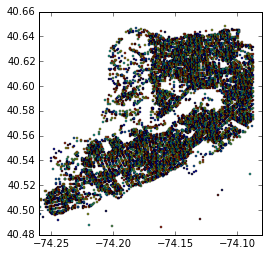

In [22]:
f = plt.figure()
df.head(9000).plot()

In [10]:
df.ix[0].geometry.y

119412.17879885435

In [12]:
# from ctypes.util import find_library
# find_library('geos_c')

In [53]:
type(final.head())

pandas.core.frame.DataFrame

In [64]:
finalSub = final[pd.notnull(final['LOCATION'])]

In [68]:
len(finalSub)

182798

In [69]:
finalSub['geometry'] = finalSub.apply(lambda z: Point(z.LONGITUDE, z.LATITUDE), axis=1)

/Users/afair/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [54]:
final['geometry'] = final.apply(lambda z: Point(z.LONGITUDE, z.LATITUDE), axis=1)

In [70]:
finalGdf = gpd.GeoDataFrame(finalSub)

In [71]:
finalGdf.head()

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,UNIQUE KEY,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,Street Condition,Traffic Signal Condition,geometry
0,12/31/15,8:15,BROOKLYN,11214,40.612216,-73.997173,"(40.6122155, -73.9971727)",18 AVENUE,77 STREET,NaN,1,0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,3363761,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,11,4,POINT (-73.99717270000001 40.6122155)
2,12/31/15,8:20,NaN,NaN,40.525888,-74.229805,"(40.5258882, -74.2298047)",NaN,NaN,NaN,0,0,0,0,0,0,0,0,Traffic Control Disregarded,NaN,NaN,NaN,NaN,3363349,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,7,2,POINT (-74.2298047 40.5258882)
3,12/31/15,8:30,BROOKLYN,11236,40.641947,-73.916619,"(40.641947, -73.9166193)",EAST 83 STREET,FOSTER AVENUE,NaN,0,0,0,0,0,0,0,0,View Obstructed/Limited,View Obstructed/Limited,NaN,NaN,NaN,3363070,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN,1,0,POINT (-73.91661929999999 40.64194699999999)
4,12/31/15,8:30,MANHATTAN,10038,40.709872,-74.007052,"(40.7098718, -74.0070517)",FULTON STREET,DUTCH STREET,NaN,0,0,0,0,0,0,0,0,Other Vehicular,Other Vehicular,NaN,NaN,NaN,3362791,PASSENGER VEHICLE,UNKNOWN,NaN,NaN,NaN,58,6,POINT (-74.00705170000001 40.7098718)
5,12/31/15,8:30,QUEENS,11691,40.596001,-73.770663,"(40.596001, -73.7706626)",BEACH 38 STREET,BEACH CHANNEL DRIVE,NaN,0,0,0,0,0,0,0,0,Backing Unsafely,Unspecified,NaN,NaN,NaN,3363159,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN,4,2,POINT (-73.77066259999999 40.596001)


In [72]:
finalGdf.to_file('vzOutSub.shp')

RuntimeError: Failed to sync to disk

In [62]:
# finalGdf.to_crs(epsg=4326, inplace=True)
finalGdf.to_crs(epsg=4326)

ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

In [73]:
with open('vzOutSub.geojson', 'w') as f:
    f.write(finalGdf.to_json())

In [ ]:
# finalGdf.to_file('geoDF.geojson', driver="GeoJSON")

In [ ]:
with collection("intersectionNodes.shp", "r") as input:
    for p in input:
        print p
#         print shape(p['geometry'])

In [25]:
!pwd

/Users/afair/Google Drive/C1_Project1/data/vz311


In [27]:
bikeFilePath = "../nyc-bike-routes-2015/nyc_bike_routes_2015.shp"
bikes = gpd.read_file(bikeFilePath)
bikes.head()

In [30]:
bikes.shape

(10932, 19)

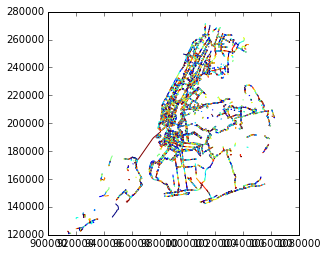

In [31]:
# f = plt.figure()
bikes.plot()

In [117]:
!pwd

/Users/afair/Google Drive/C1_Project1/data/vz311


In [118]:
dat = pd.read_csv('../vzwV1.csv')

In [122]:
dat.head(50)

,identity,label,NUMBER_OF_PERSONS_INJURED,NUMBER_OF_PERSONS_KILLED,NUMBER_OF_PEDESTRIANS_INJURED,NUMBER_OF_PEDESTRIANS_KILLED,NUMBER_OF_CYCLIST_INJURED,NUMBER_OF_CYCLIST_KILLED,NUMBER_OF_MOTORIST_INJURED,NUMBER_OF_MOTORIST_KILLED,CONTRIBUTING_FACTOR_VEHICLE_1-3291249.0,CONTRIBUTING_FACTOR_VEHICLE_1-Accelerator Defective,CONTRIBUTING_FACTOR_VEHICLE_1-Aggressive Driving/Road Rage,CONTRIBUTING_FACTOR_VEHICLE_1-Alcohol Involvement,CONTRIBUTING_FACTOR_VEHICLE_1-Animals Action,CONTRIBUTING_FACTOR_VEHICLE_1-Backing Unsafely,CONTRIBUTING_FACTOR_VEHICLE_1-Brakes Defective,CONTRIBUTING_FACTOR_VEHICLE_1-CONTROL,CONTRIBUTING_FACTOR_VEHICLE_1-Cell Phone (hand-held),CONTRIBUTING_FACTOR_VEHICLE_1-Cell Phone (hands-free),CONTRIBUTING_FACTOR_VEHICLE_1-Driver Inattention/Distraction,CONTRIBUTING_FACTOR_VEHICLE_1-Driver Inexperience,CONTRIBUTING_FACTOR_VEHICLE_1-Drugs (Illegal),CONTRIBUTING_FACTOR_VEHICLE_1-Failure to Keep Right,CONTRIBUTING_FACTOR_VEHICLE_1-Failure to Yield Right-of-Way,CONTRIBUTING_FACTOR_VEHICLE_1-Fatigued/Drowsy,CONTRIBUTING_FACTOR_VEHICLE_1-Fell Asleep,CONTRIBUTING_FACTOR_VEHICLE_1-Following Too Closely,CONTRIBUTING_FACTOR_VEHICLE_1-Glare,CONTRIBUTING_FACTOR_VEHICLE_1-Headlights Defective,CONTRIBUTING_FACTOR_VEHICLE_1-Illness,CONTRIBUTING_FACTOR_VEHICLE_1-Lane Marking Improper/Inadequate,CONTRIBUTING_FACTOR_VEHICLE_1-Lost Consciousness,CONTRIBUTING_FACTOR_VEHICLE_1-Obstruction/Debris,CONTRIBUTING_FACTOR_VEHICLE_1-Other Electronic Device,CONTRIBUTING_FACTOR_VEHICLE_1-Other Lighting Defects,CONTRIBUTING_FACTOR_VEHICLE_1-Other Vehicular,CONTRIBUTING_FACTOR_VEHICLE_1-Outside Car Distraction,CONTRIBUTING_FACTOR_VEHICLE_1-Oversized Vehicle,CONTRIBUTING_FACTOR_VEHICLE_1-Passenger Distraction,CONTRIBUTING_FACTOR_VEHICLE_1-Passing or Lane Usage Improper,CONTRIBUTING_FACTOR_VEHICLE_1-Pavement Defective,CONTRIBUTING_FACTOR_VEHICLE_1-Pavement Slippery,CONTRIBUTING_FACTOR_VEHICLE_1-Pedestrian/Bicyclist/Other Pedestrian Error/Confusion,CONTRIBUTING_FACTOR_VEHICLE_1-Physical Disability,CONTRIBUTING_FACTOR_VEHICLE_1-Prescription Medication,CONTRIBUTING_FACTOR_VEHICLE_1-Reaction to Other Uninvolved Vehicle,CONTRIBUTING_FACTOR_VEHICLE_1-Shoulders Defective/Improper,CONTRIBUTING_FACTOR_VEHICLE_1-Steering Failure,CONTRIBUTING_FACTOR_VEHICLE_1-Tire Failure/Inadequate,CONTRIBUTING_FACTOR_VEHICLE_1-Tow Hitch Defective,CONTRIBUTING_FACTOR_VEHICLE_1-Traffic Control Device Improper/Non-Working,CONTRIBUTING_FACTOR_VEHICLE_1-Traffic Control Disregarded,CONTRIBUTING_FACTOR_VEHICLE_1-Turning Improperly,CONTRIBUTING_FACTOR_VEHICLE_1-Unsafe Lane Changing,CONTRIBUTING_FACTOR_VEHICLE_1-Unsafe Speed,CONTRIBUTING_FACTOR_VEHICLE_1-Unspecified,CONTRIBUTING_FACTOR_VEHICLE_1-View Obstructed/Limited,CONTRIBUTING_FACTOR_VEHICLE_1-Windshield Inadequate,CONTRIBUTING_FACTOR_VEHICLE_1-nan,CONTRIBUTING_FACTOR_VEHICLE_2-Accelerator Defective,CONTRIBUTING_FACTOR_VEHICLE_2-Aggressive Driving/Road Rage,CONTRIBUTING_FACTOR_VEHICLE_2-Alcohol Involvement,CONTRIBUTING_FACTOR_VEHICLE_2-Animals Action,CONTRIBUTING_FACTOR_VEHICLE_2-Backing Unsafely,CONTRIBUTING_FACTOR_VEHICLE_2-Brakes Defective,CONTRIBUTING_FACTOR_VEHICLE_2-CONTROL,CONTRIBUTING_FACTOR_VEHICLE_2-Cell Phone (hand-held),CONTRIBUTING_FACTOR_VEHICLE_2-Cell Phone (hands-free),CONTRIBUTING_FACTOR_VEHICLE_2-Driver Inattention/Distraction,CONTRIBUTING_FACTOR_VEHICLE_2-Driver Inexperience,CONTRIBUTING_FACTOR_VEHICLE_2-Drugs (Illegal),CONTRIBUTING_FACTOR_VEHICLE_2-Failure to Keep Right,CONTRIBUTING_FACTOR_VEHICLE_2-Failure to Yield Right-of-Way,CONTRIBUTING_FACTOR_VEHICLE_2-Fatigued/Drowsy,CONTRIBUTING_FACTOR_VEHICLE_2-Fell Asleep,CONTRIBUTING_FACTOR_VEHICLE_2-Following Too Closely,CONTRIBUTING_FACTOR_VEHICLE_2-Glare,CONTRIBUTING_FACTOR_VEHICLE_2-Headlights Defective,CONTRIBUTING_FACTOR_VEHICLE_2-Illness,CONTRIBUTING_FACTOR_VEHICLE_2-Lane Marking Improper/Inadequate,CONTRIBUTING_FACTOR_VEHICLE_2-Lost Consciousness,CONTRIBUTING_FACTOR_VEHICLE_2-Obstruction/Debris,CONTRIBUTING_FACTOR_VEHICLE_2-Other Electronic Device,CONTRIBUT

In [121]:
dat.shape

(293578, 280)